Calculate the Bayes Factor for $M_*$ to determine whether the void and wall samples are drawn from the same or different parent distributions.

In [1]:
from astropy.table import Table
from astropy.io import fits

import numpy as np

import sys

import pickle

import pocomc as pc

import matplotlib
import matplotlib.pyplot as plt

from functions import Model_1_plot, Model_2_plot

np.set_printoptions(threshold=sys.maxsize)

In [2]:
matplotlib.rc('font', size=14)
matplotlib.rc('font', family='DejaVu Sans')

# Data

In [3]:
#data_directory = '../../../../data/'
data_directory = '../../../../Data/NSA/'
data_filename = data_directory + 'nsa_v1_0_1_VAGC_vflag-V2_sys_(1).fits'

hdu = fits.open(data_filename)
data = Table(hdu[1].data)
hdu.close()

## Just keep the main SDSS DR7 footprint

In [4]:
# When the catalog is the NSA, only keep those objects which were originally in the DR7 LSS
catalog_SDSS = data[data['IN_DR7_LSS'] == 1]

ra_boolean = np.logical_and(catalog_SDSS['RA'] > 110, catalog_SDSS['RA'] < 270)
catalog_north = catalog_SDSS[ra_boolean]

strip_boolean = np.logical_and.reduce([catalog_north['RA'] > 250, 
                                       catalog_north['RA'] < 269, 
                                       catalog_north['DEC'] > 51, 
                                       catalog_north['DEC'] < 67])
catalog_main = catalog_north[~strip_boolean]

In [5]:
Mstar_NSA = np.log10(catalog_main['ELPETRO_MASS'])

/opt/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log10
  """Entry point for launching an IPython kernel.


# Separate galaxies by their $V^2$ LSS classifications

## $0.2\overline{\rho}$, no $R_{\rm min}$ cut

In [6]:
wall_noRmin = catalog_main['vflag_V2_noRmin'] == 0
void_noRmin = catalog_main['vflag_V2_noRmin'] == 1
edge_noRmin = catalog_main['vflag_V2_noRmin'] == 2
out_noRmin = catalog_main['vflag_V2_noRmin'] == 9

## $0.1\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

In [7]:
wall_0p1 = catalog_main['vflag_V2_0p1rho'] == 0
void_0p1 = catalog_main['vflag_V2_0p1rho'] == 1
edge_0p1 = catalog_main['vflag_V2_0p1rho'] == 2
out_0p1 = catalog_main['vflag_V2_0p1rho'] == 9

## $0.3\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

In [8]:
wall_0p3 = catalog_main['vflag_V2_0p3rho'] == 0
void_0p3 = catalog_main['vflag_V2_0p3rho'] == 1
edge_0p3 = catalog_main['vflag_V2_0p3rho'] == 2
out_0p3 = catalog_main['vflag_V2_0p3rho'] == 9

In [9]:
del catalog_main, catalog_north, data

# Fit the stellar mass distributions with skewnormal distributions

Both one- and two-parent models

This is a unimodal distribution

In [10]:
Mstar_bins = np.arange(7.5, 11.5, 0.1)

In [11]:
labels1_bi = ['s', 'a', r'$\mu_a$', r'$\sigma_a$', 'skew$_a$', 
                   'b', r'$\mu_b$', r'$\sigma_b$', 'skew$_b$']
labels2_bi = ['$a_1$', r'$\mu_{1a}$', r'$\sigma_{1a}$', 'skew$_{1a}$', 
              '$b_1$', r'$\mu_{1b}$', r'$\sigma_{1b}$', 'skew$_{1b}$', 
              '$a_2$', r'$\mu_{2a}$', r'$\sigma_{2a}$', 'skew$_{2a}$', 
              '$b_2$', r'$\mu_{2b}$', r'$\sigma_{2b}$', 'skew$_{2b}$']

## $0.2\overline{\rho}$, no $R_{\rm min}$ cut

### 1-parent model

#### Void v. wall

In [12]:
temp_infile = open('pocoMC_results/sampler_results_M1_Mstar_V2-noRmin(1).pickle', 'rb')
V2noRmin_results1 = pickle.load(temp_infile)
temp_infile.close()

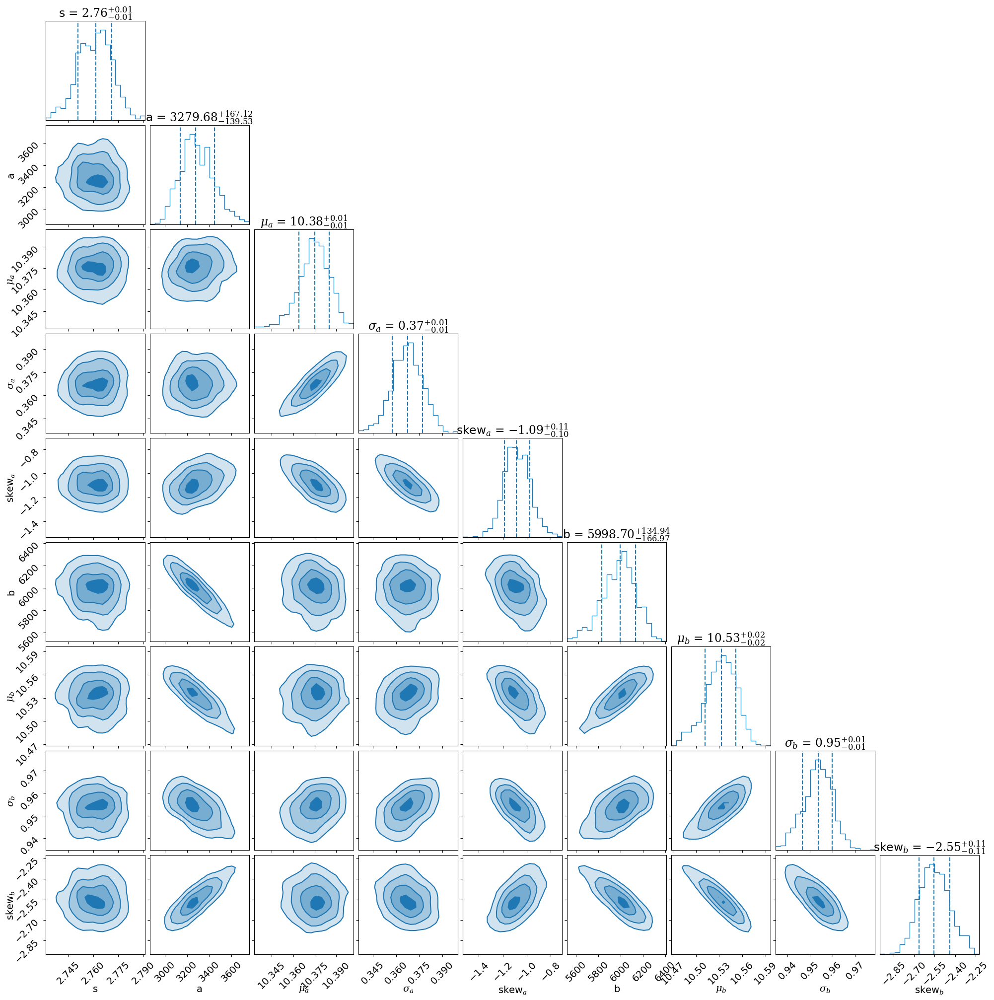

In [13]:
pc.plotting.corner(V2noRmin_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [14]:
lnzM1_V2noRmin = V2noRmin_results1['logz'][-1]
lnzM1_V2noRmin

-1025.2614085323614

In [17]:
V2noRmin_bestfit1 = np.median(V2noRmin_results1['samples'], axis=0)

V2noRmin_bestfit1

array([ 2.7615786e+00,  3.2796782e+03,  1.0375050e+01,  3.6738709e-01,
       -1.0851800e+00,  5.9987021e+03,  1.0533173e+01,  9.5362008e-01,
       -2.5541477e+00], dtype=float32)

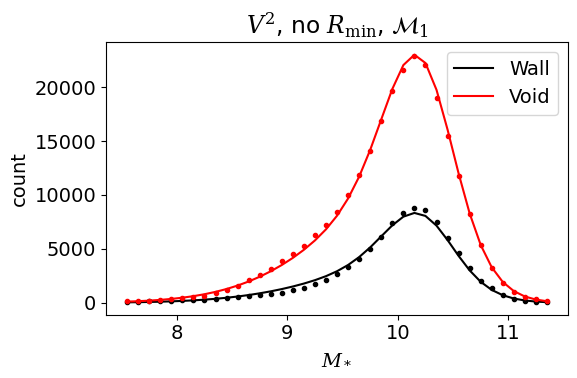

In [18]:
Model_1_plot(V2noRmin_bestfit1, 
             Mstar_NSA[wall_noRmin], 
             Mstar_NSA[void_noRmin], 
             Mstar_bins, 
             2, 
             xlabel_text='$M_*$', 
             title_text=r'$V^2$, no $R_{\rm min}$, $\mathcal{M}_1$');

#### Wall v. all

In [32]:
temp_infile = open('pocoMC_results/sampler_results_M1_Mstar_V2wall-noRmin(1).pickle', 'rb')
V2wallnoRmin_results1 = pickle.load(temp_infile)
temp_infile.close()

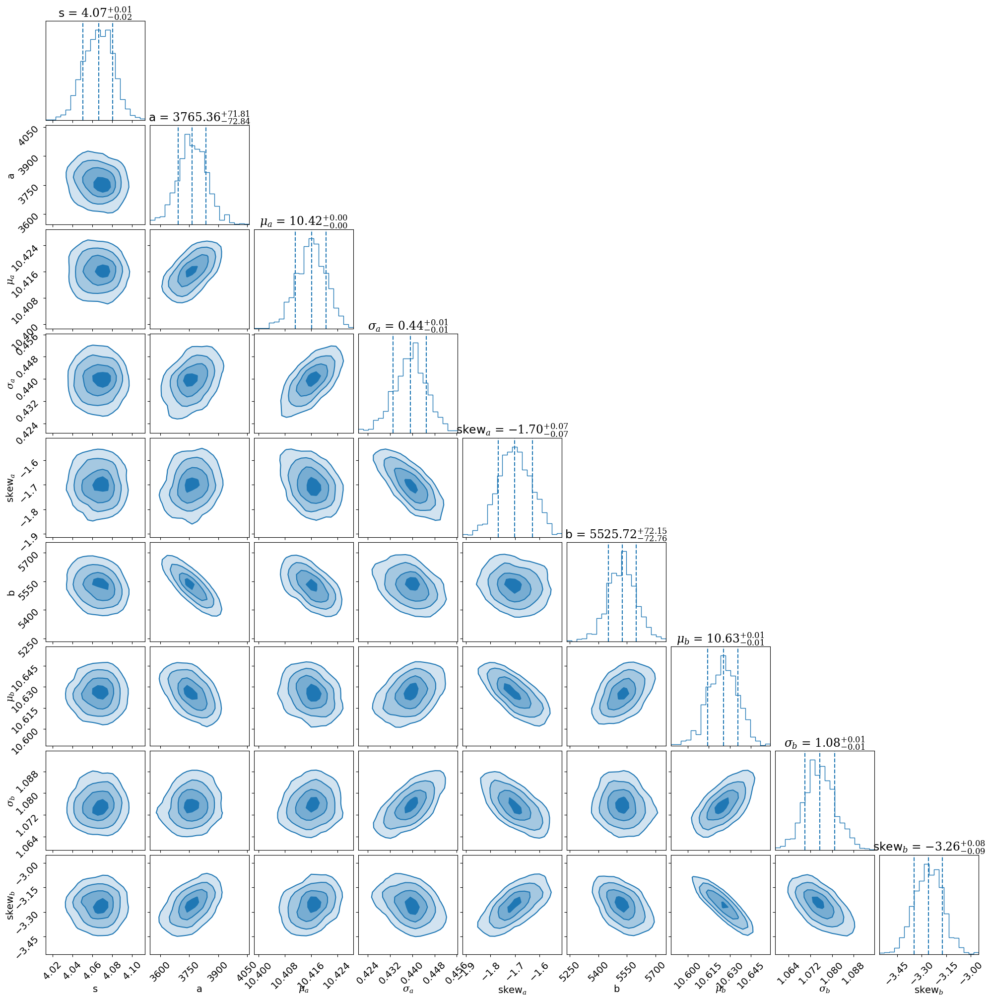

In [33]:
pc.plotting.corner(V2wallnoRmin_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [34]:
lnzM1_V2wallnoRmin = V2wallnoRmin_results1['logz'][-1]
lnzM1_V2wallnoRmin

-983.1634162217265

In [37]:
V2wallnoRmin_bestfit1 = np.median(V2wallnoRmin_results1['samples'], axis=0)

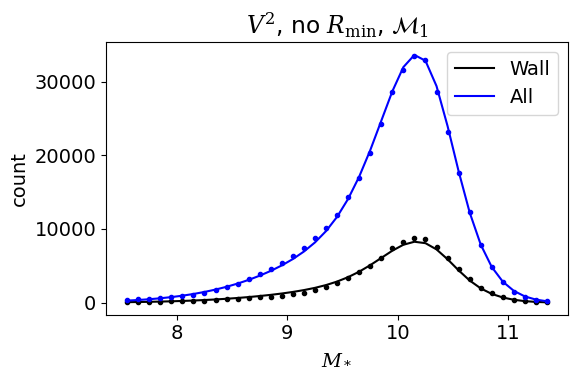

In [38]:
Model_1_plot(V2wallnoRmin_bestfit1, 
             Mstar_NSA[wall_noRmin], 
             Mstar_NSA[void_noRmin | wall_noRmin | edge_noRmin], 
             Mstar_bins, 
             2, 
             label1_text='Wall', 
             label2_text='All',
             xlabel_text='$M_*$', 
             title_text=r'$V^2$, no $R_{\rm min}$, $\mathcal{M}_1$');

#### Void v. all

In [62]:
temp_infile = open('pocoMC_results/sampler_results_M1_Mstar_V2void-noRmin(1).pickle', 'rb')
V2voidnoRmin_results1 = pickle.load(temp_infile)
temp_infile.close()

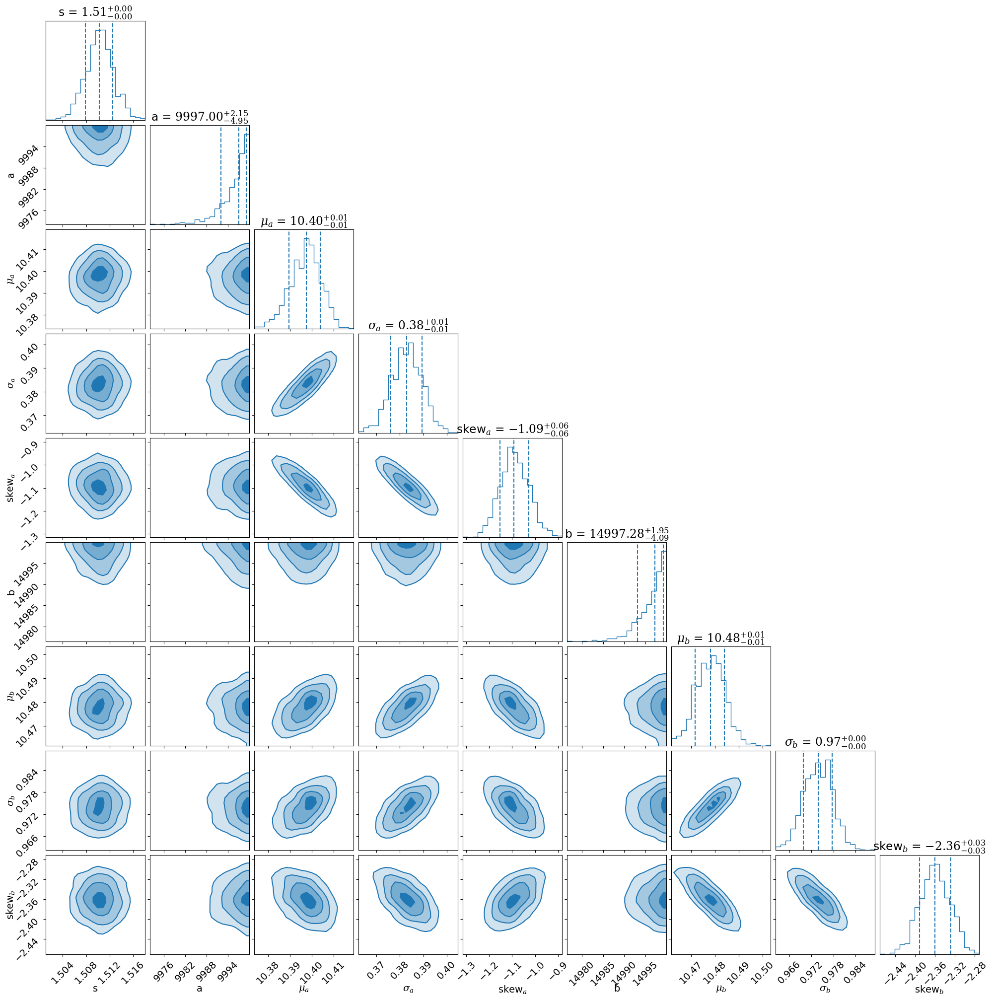

In [63]:
pc.plotting.corner(V2voidnoRmin_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [ ]:
lnzM1_V2voidnoRmin = V2voidnoRmin_results1['logz'][-1]
lnzM1_V2voidnoRmin

In [ ]:
V2voidnoRmin_bestfit1 = np.median(V2voidnoRmin_results1['samples'], axis=0)

In [ ]:
Model_1_plot(V2voidnoRmin_bestfit1, 
             Mstar_NSA[void_noRmin], 
             Mstar_NSA[void_noRmin | void_noRmin | edge_noRmin], 
             Mstar_bins, 
             2, 
             label1_text='Void', 
             label2_text='All',
             xlabel_text='$M_*$', 
             title_text=r'$V^2$, no $R_{\rm min}$, $\mathcal{M}_1$');

### 2-parent model

#### Void v. wall

In [25]:
temp_infile = open('pocoMC_results/sampler_results_M2_Mstar_V2-noRmin(1).pickle', 'rb')
V2noRmin_results2 = pickle.load(temp_infile)
temp_infile.close()

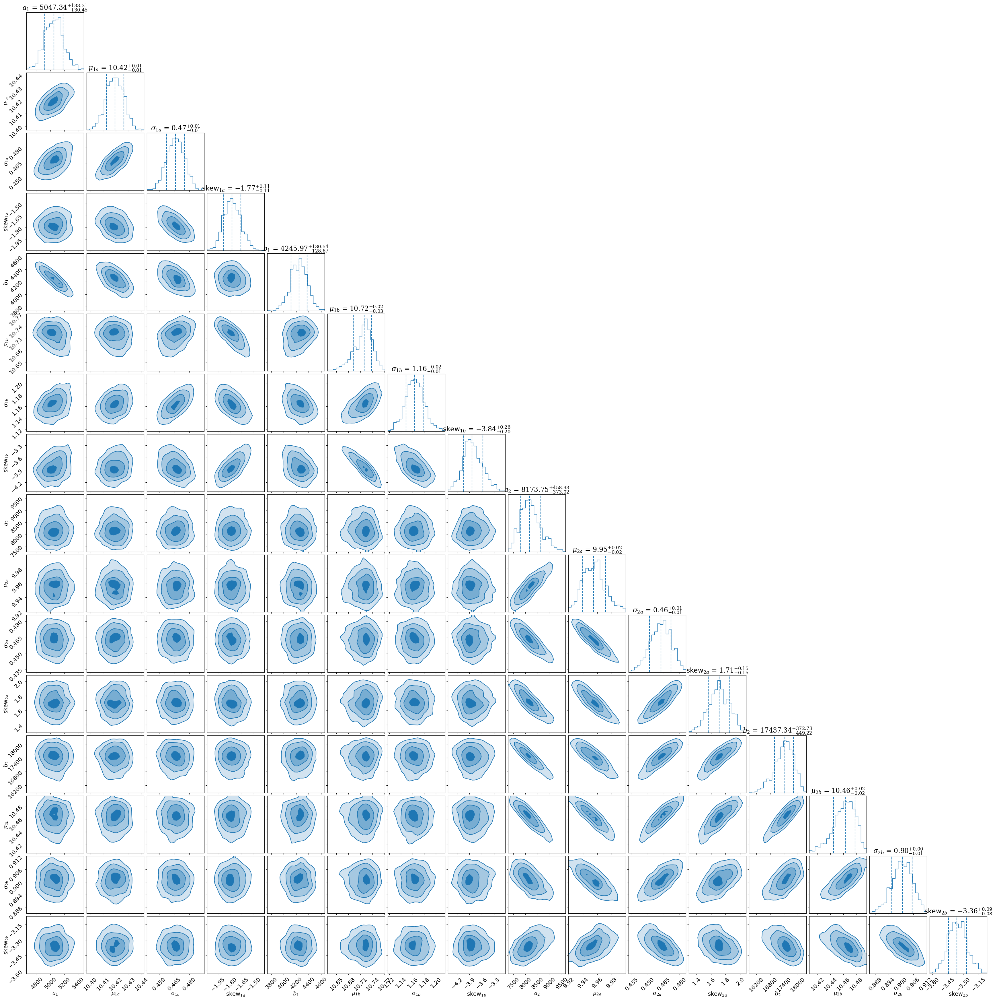

In [26]:
pc.plotting.corner(V2noRmin_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [27]:
lnzM2_V2noRmin = V2noRmin_results2['logz'][-1]
lnzM1_V2noRmin

-1025.2614085323614

In [28]:
V2noRmin_bestfit2 = np.median(V2noRmin_results2['samples'], axis=0)

V2noRmin_bestfit2

array([ 5.0473408e+03,  1.0419199e+01,  4.6634704e-01, -1.7736354e+00,
        4.2459673e+03,  1.0719050e+01,  1.1630434e+00, -3.8380609e+00,
        8.1737544e+03,  9.9548254e+00,  4.6232218e-01,  1.7100089e+00,
        1.7437338e+04,  1.0463019e+01,  9.0088844e-01, -3.3607004e+00],
      dtype=float32)

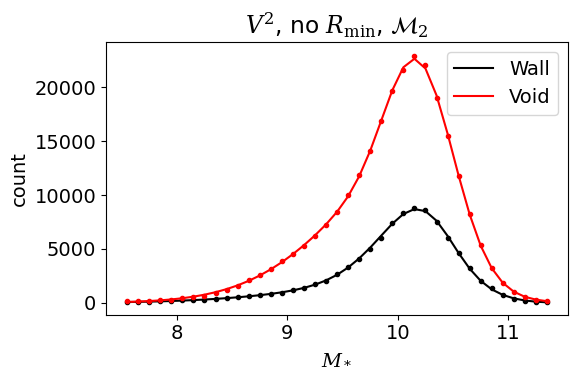

In [30]:
Model_2_plot(V2noRmin_bestfit2, 
             Mstar_NSA[wall_noRmin], 
             Mstar_NSA[void_noRmin], 
             Mstar_bins, 
             2, 
             xlabel_text='$M_*$', 
             title_text=r'$V^2$, no $R_{\rm min}$, $\mathcal{M}_2$');

#### Wall v. all

In [47]:
temp_infile = open('pocoMC_results/sampler_results_M2_Mstar_V2wall-noRmin(1).pickle', 'rb')
V2wallnoRmin_results2 = pickle.load(temp_infile)
temp_infile.close()

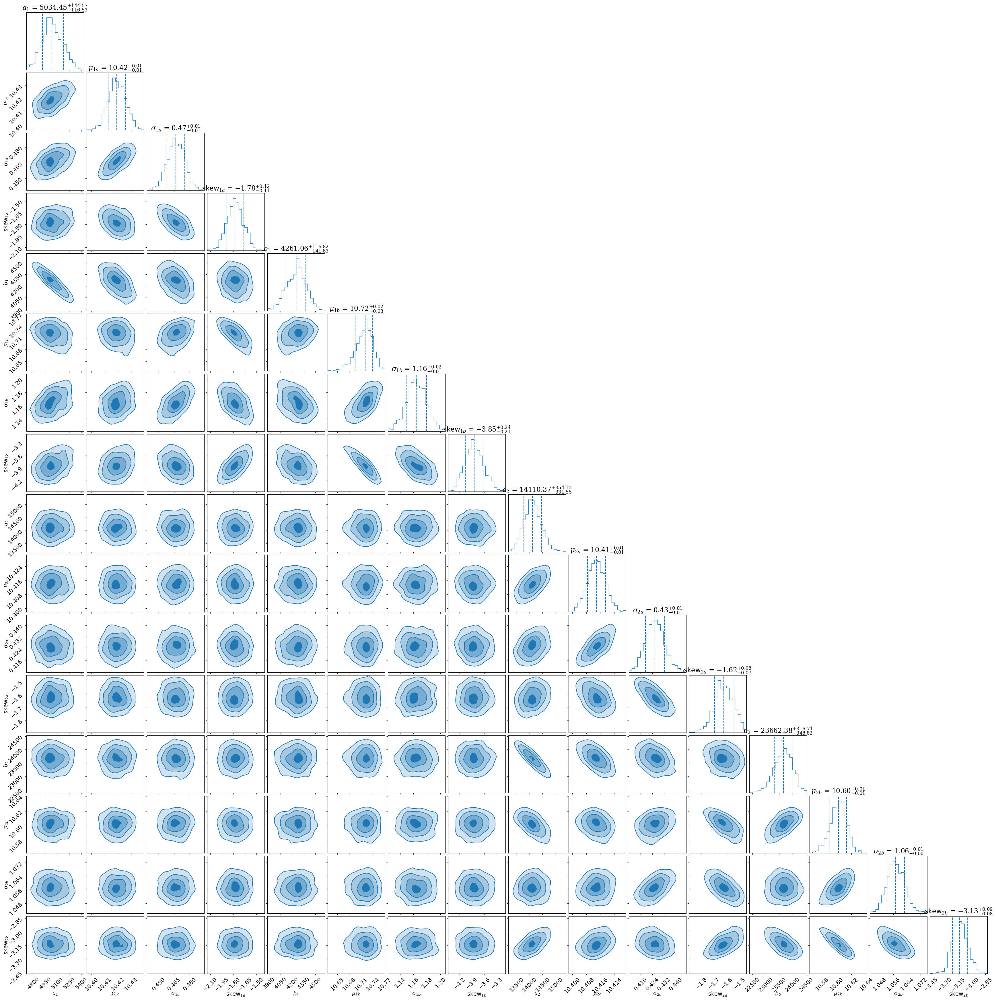

In [48]:
pc.plotting.corner(V2wallnoRmin_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [49]:
lnzM2_V2wallnoRmin = V2wallnoRmin_results2['logz'][-1]
lnzM1_V2wallnoRmin

-983.1634162217265

In [50]:
V2wallnoRmin_bestfit2 = np.median(V2wallnoRmin_results2['samples'], axis=0)

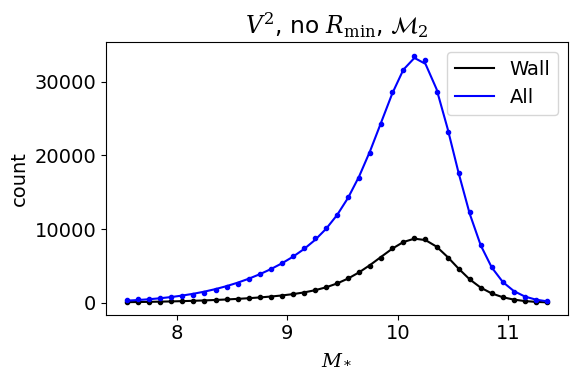

In [52]:
Model_2_plot(V2wallnoRmin_bestfit2, 
             Mstar_NSA[wall_noRmin], 
             Mstar_NSA[void_noRmin | wall_noRmin | edge_noRmin], 
             Mstar_bins, 
             2, 
             label1_text='Wall', 
             label2_text='All',
             xlabel_text='$M_*$', 
             title_text=r'$V^2$, no $R_{\rm min}$, $\mathcal{M}_2$');

#### Void v. all

In [64]:
temp_infile = open('pocoMC_results/sampler_results_M2_Mstar_V2void-noRmin(1).pickle', 'rb')
V2voidnoRmin_results2 = pickle.load(temp_infile)
temp_infile.close()

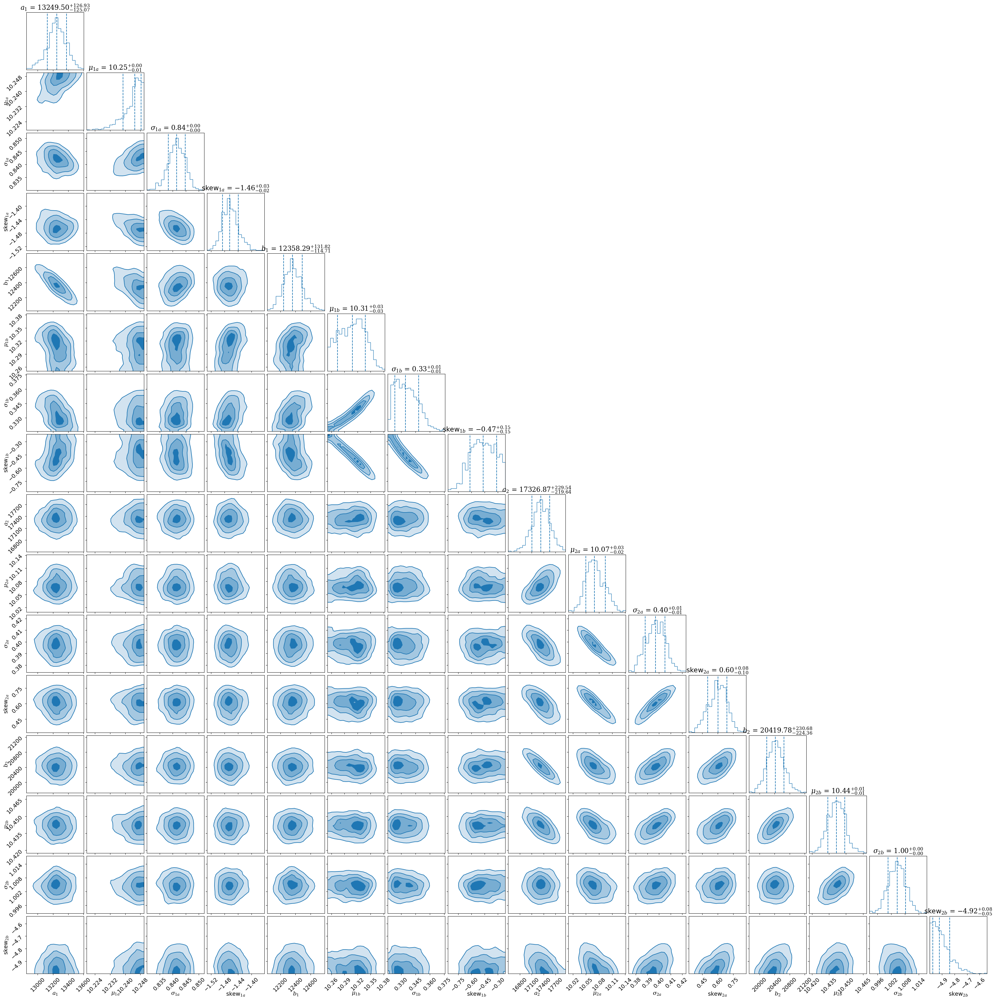

In [65]:
pc.plotting.corner(V2voidnoRmin_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [ ]:
lnzM2_V2voidnoRmin = V2voidnoRmin_results2['logz'][-1]
lnzM1_V2voidnoRmin

In [ ]:
V2voidnoRmin_bestfit2 = np.median(V2voidnoRmin_results2['samples'], axis=0)

In [ ]:
Model_2_plot(V2voidnoRmin_Mstar_bestfit2, 
             Mstar_NSA[void_noRmin], 
             Mstar_NSA[void_noRmin | wall_noRmin | edge_noRmin], 
             Mstar_bins, 
             2, 
             label1_text='Void', 
             label2_text='All',
             xlabel_text='$M_*$', 
             title_text=r'$V^2$, no $R_{\rm min}$, $\mathcal{M}_2$')

### Calculate Bayes factor

#### Void v. wall

In [31]:
lnB12_V2noRmin = lnzM1_V2noRmin - lnzM2_V2noRmin

B12_V2noRmin = np.exp(lnB12_V2noRmin)

print('V2 (void v. wall) M*: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2noRmin, lnB12_V2noRmin*np.log10(np.exp(1))))

V2 (void v. wall) M*: B12 = 4.16e-223; log(B12) = -222.381


#### Wall v. all

In [55]:
lnB12_V2wallnoRmin = lnzM1_V2wallnoRmin - lnzM2_V2wallnoRmin

B12_V2wallnoRmin = np.exp(lnB12_V2wallnoRmin)

print('V2 (wall v. all) M*: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2wallnoRmin, lnB12_V2wallnoRmin*np.log10(np.exp(1))))

V2 (wall v. all) M*: B12 = 8.93e-165; log(B12) = -164.049


## $0.1\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

### 1-parent model

In [71]:
temp_infile = open('pocoMC_results/sampler_results_M1_Mstar_V2-0p1(1).pickle', 'rb')
V2_0p1_results1 = pickle.load(temp_infile)
temp_infile.close()

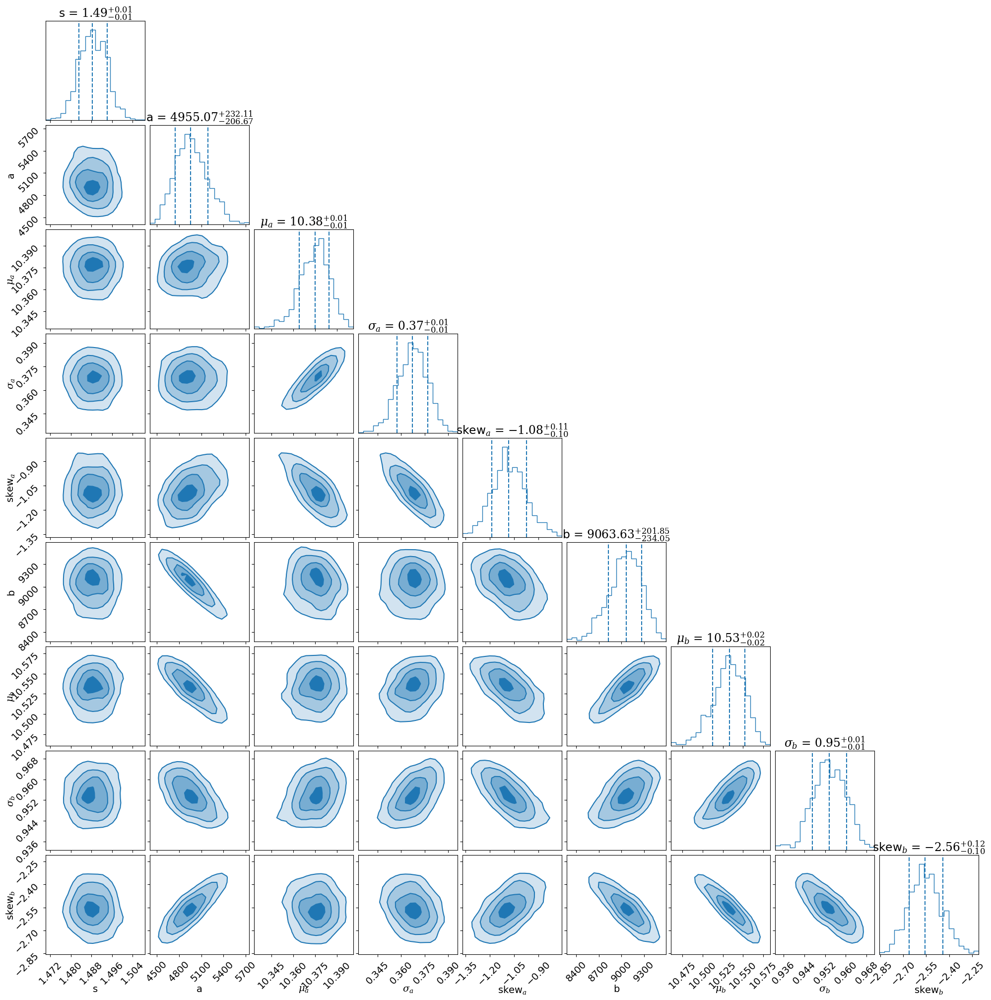

In [72]:
pc.plotting.corner(V2_0p1_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [73]:
lnzM1_V2_0p1 = V2_0p1_results1['logz'][-1]
lnzM1_V2_0p1

-925.7468583397792

In [74]:
V2_0p1_bestfit1 = np.median(V2_0p1_results1['samples'], axis=0)

V2_0p1_bestfit1

array([ 1.4884450e+00,  4.9550742e+03,  1.0375109e+01,  3.6732933e-01,
       -1.0829344e+00,  9.0636270e+03,  1.0533119e+01,  9.5354098e-01,
       -2.5589309e+00], dtype=float32)

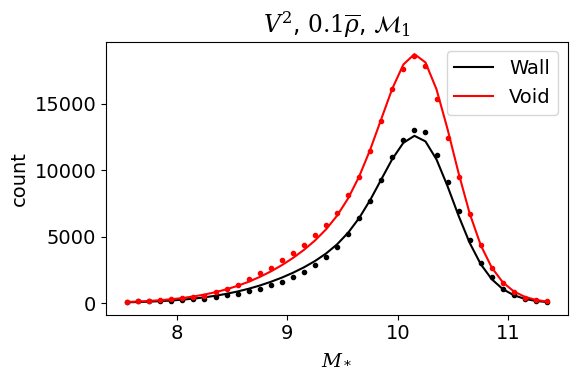

In [75]:
Model_1_plot(V2_0p1_bestfit1, 
             Mstar_NSA[wall_0p1], 
             Mstar_NSA[void_0p1], 
             Mstar_bins, 
             2, 
             xlabel_text='$M_*$', 
             title_text=r'$V^2$, $0.1\overline{\rho}$, $\mathcal{M}_1$');

### 2-parent model

In [78]:
temp_infile = open('pocoMC_results/sampler_results_M2_Mstar_V2-0p1(1).pickle', 'rb')
V2_0p1_results2 = pickle.load(temp_infile)
temp_infile.close()

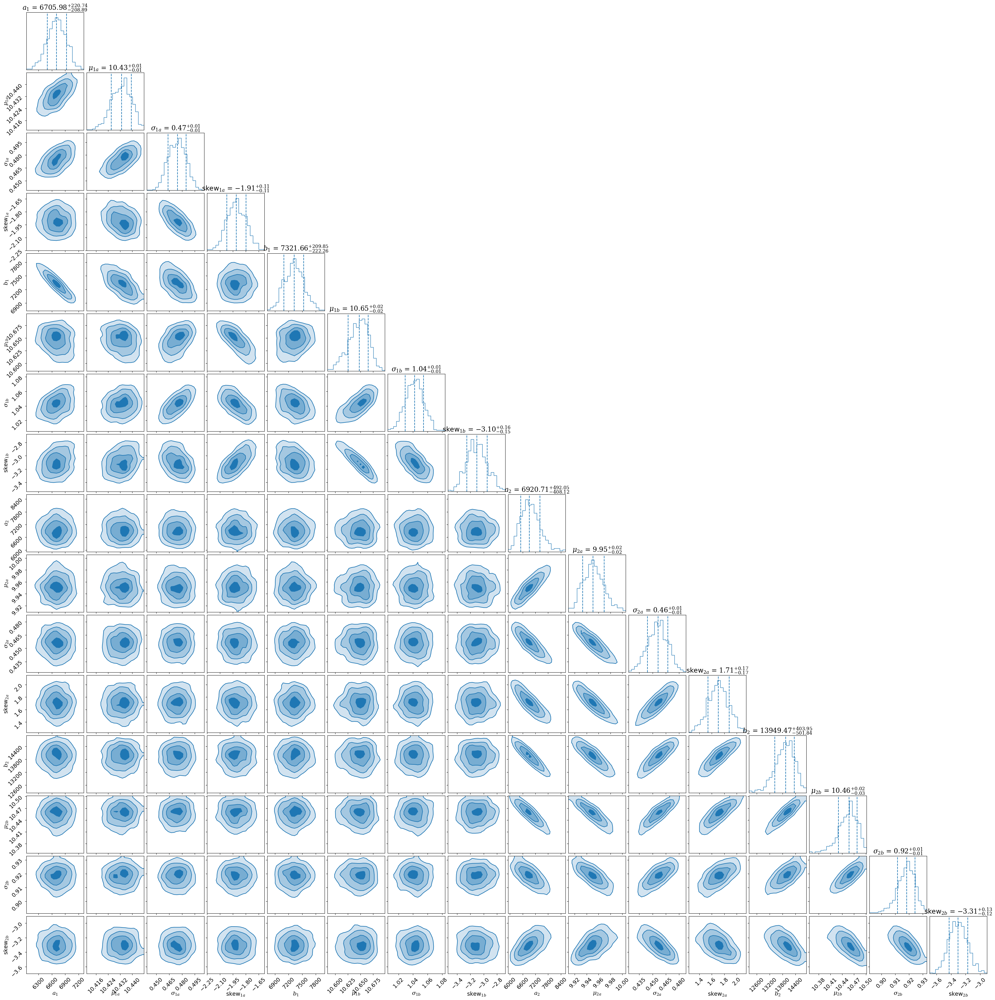

In [79]:
pc.plotting.corner(V2_0p1_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [80]:
lnzM2_V2_0p1 = V2_0p1_results2['logz'][-1]
lnzM2_V2_0p1

-517.6066369272966

In [81]:
V2_0p1_bestfit2 = np.median(V2_0p1_results2['samples'], axis=0)

V2_0p1_bestfit2

array([ 6.7059751e+03,  1.0433088e+01,  4.7463000e-01, -1.9101328e+00,
        7.3216641e+03,  1.0647417e+01,  1.0421916e+00, -3.1041505e+00,
        6.9207134e+03,  9.9508514e+00,  4.5620209e-01,  1.7060564e+00,
        1.3949471e+04,  1.0457123e+01,  9.1834652e-01, -3.3055851e+00],
      dtype=float32)

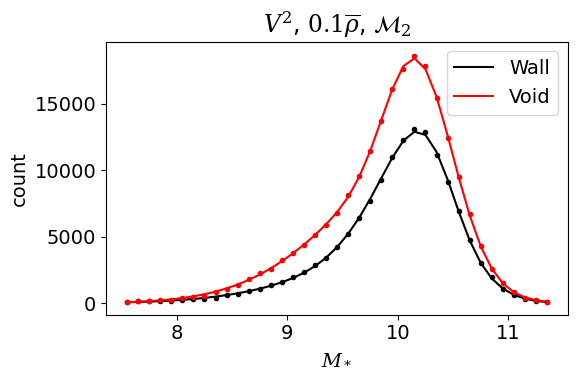

In [82]:
Model_2_plot(V2_0p1_bestfit2, 
             Mstar_NSA[wall_0p1], 
             Mstar_NSA[void_0p1], 
             Mstar_bins, 
             2, 
             xlabel_text='$M_*$', 
             title_text=r'$V^2$, $0.1\overline{\rho}$, $\mathcal{M}_2$');

### Calculate Bayes factor

In [83]:
lnB12_V2_0p1 = lnzM1_V2_0p1 - lnzM2_V2_0p1

B12_V2_0p1 = np.exp(lnB12_V2_0p1)

print('V2 M*: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2_0p1, lnB12_V2_0p1*np.log10(np.exp(1))))

V2 M*: B12 = 5.58e-178; log(B12) = -177.253


## $0.3\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

### 1-parent model

In [84]:
temp_infile = open('pocoMC_results/sampler_results_M1_Mstar_V2-0p3(1).pickle', 'rb')
V2_0p3_results1 = pickle.load(temp_infile)
temp_infile.close()

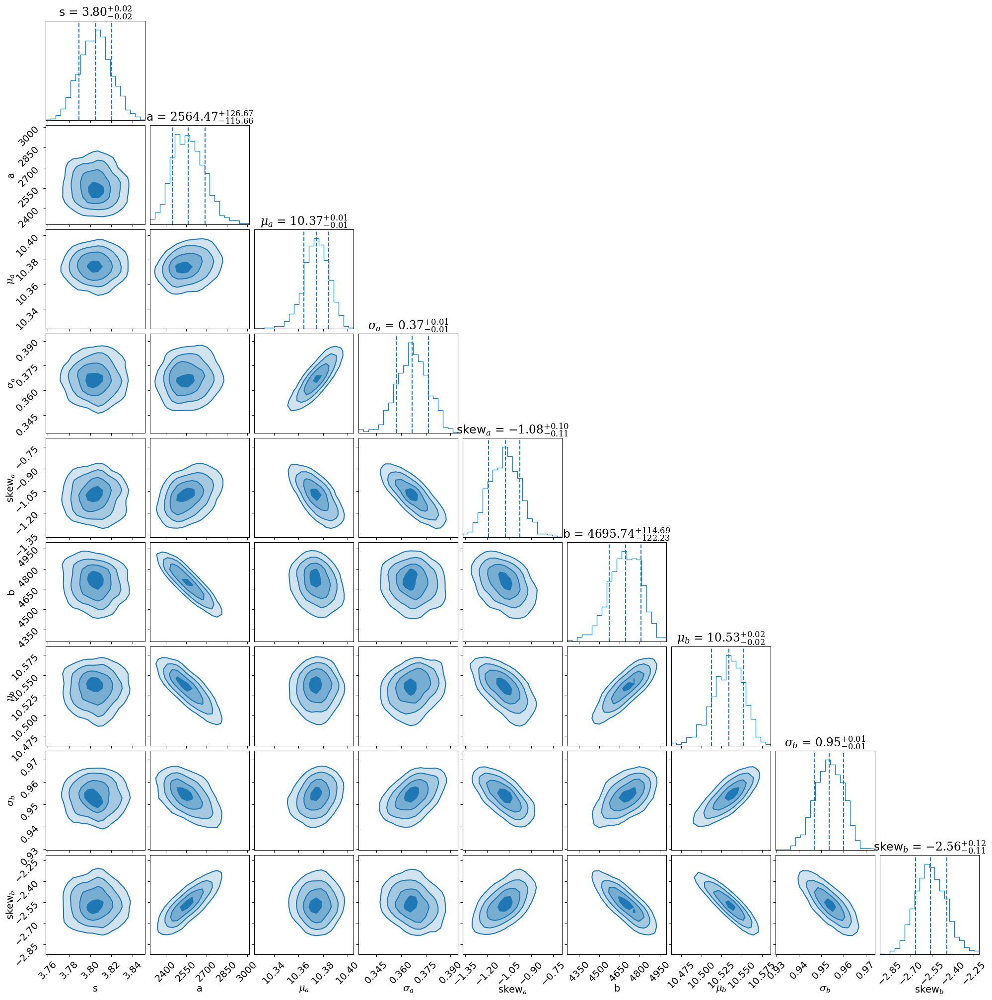

In [85]:
pc.plotting.corner(V2_0p3_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [86]:
lnzM1_V2_0p3 = V2_0p3_results1['logz'][-1]
lnzM1_V2_0p3

-903.4609557206655

In [87]:
V2_0p3_bestfit1 = np.median(V2_0p3_results1['samples'], axis=0)

V2_0p3_bestfit1

array([ 3.8049984e+00,  2.5644746e+03,  1.0374482e+01,  3.6685538e-01,
       -1.0766699e+00,  4.6957388e+03,  1.0534107e+01,  9.5361769e-01,
       -2.5606697e+00], dtype=float32)

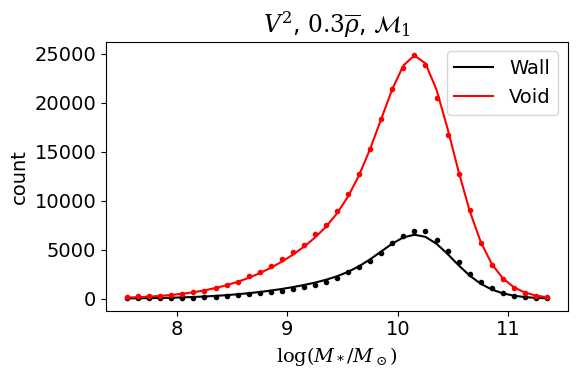

In [88]:
Model_1_plot(V2_0p3_bestfit1, 
             Mstar_NSA[wall_0p3], 
             Mstar_NSA[void_0p3], 
             Mstar_bins, 
             2, 
             xlabel_text=r'$\log(M_*/M_\odot)$', 
             title_text=r'$V^2$, $0.3\overline{\rho}$, $\mathcal{M}_1$');

### 2-parent model

In [89]:
temp_infile = open('pocoMC_results/sampler_results_M2_Mstar_V2-0p3(1).pickle', 'rb')
V2_0p3_results2 = pickle.load(temp_infile)
temp_infile.close()

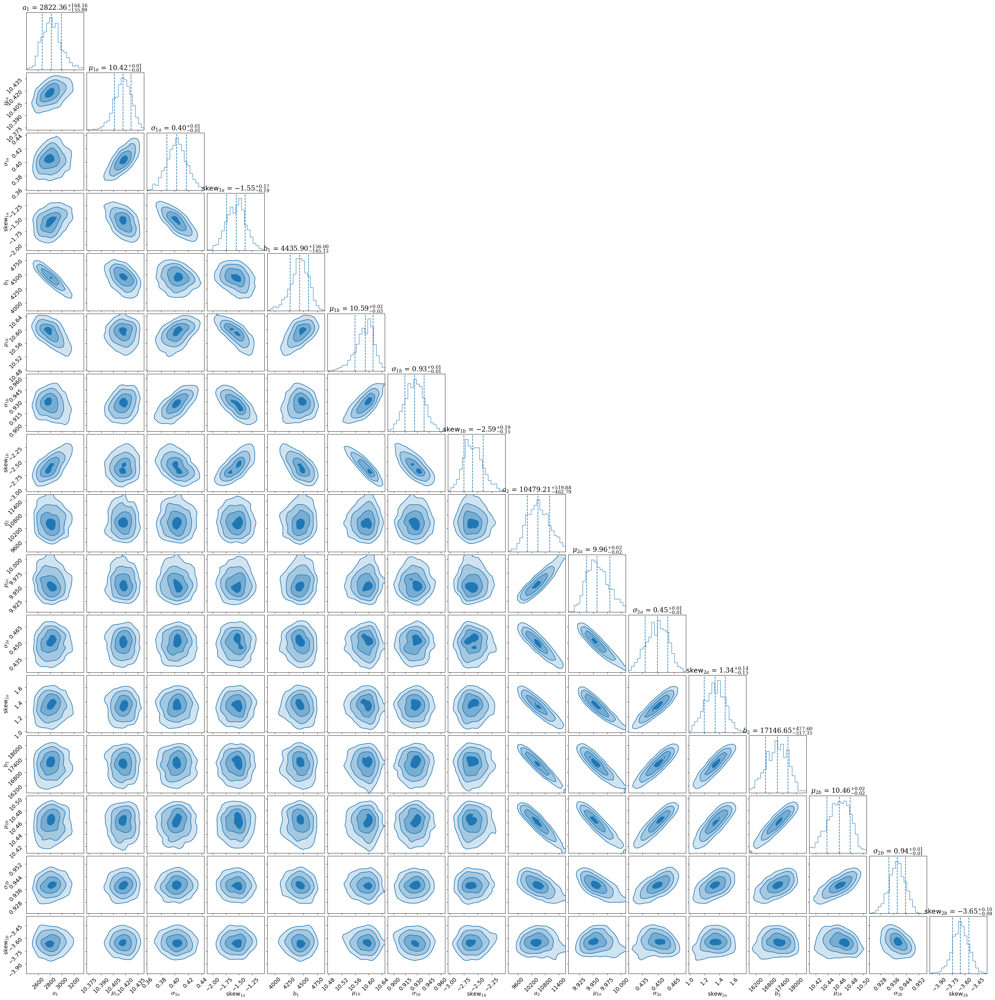

In [90]:
pc.plotting.corner(V2_0p3_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [91]:
lnzM2_V2_0p3 = V2_0p3_results2['logz'][-1]
lnzM2_V2_0p3

-525.027367641312

In [92]:
V2_0p3_bestfit2 = np.median(V2_0p3_results2['samples'], axis=0)

V2_0p3_bestfit2

array([ 2.8223608e+03,  1.0416897e+01,  4.0276465e-01, -1.5508442e+00,
        4.4358984e+03,  1.0590178e+01,  9.2662400e-01, -2.5938010e+00,
        1.0479209e+04,  9.9564495e+00,  4.4942921e-01,  1.3428452e+00,
        1.7146654e+04,  1.0459606e+01,  9.3841749e-01, -3.6525545e+00],
      dtype=float32)

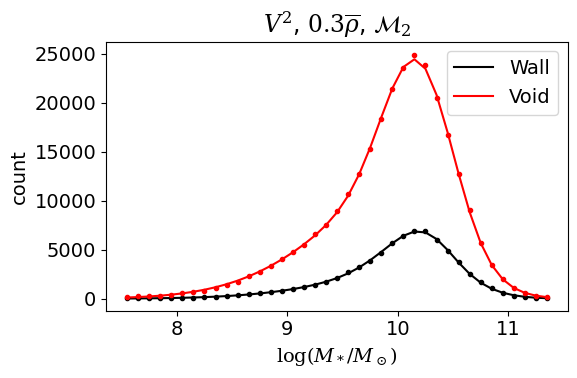

In [93]:
Model_2_plot(V2_0p3_bestfit2, 
             Mstar_NSA[wall_0p3], 
             Mstar_NSA[void_0p3], 
             Mstar_bins, 
             2, 
             xlabel_text=r'$\log (M_*/M_\odot)$', 
             title_text=r'$V^2$, $0.3\overline{\rho}$, $\mathcal{M}_2$');

### Calculate Bayes factor

In [94]:
lnB12_V2_0p3 = lnzM1_V2_0p3 - lnzM2_V2_0p3

B12_V2_0p3 = np.exp(lnB12_V2_0p3)

print('V2 M*: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2_0p3, lnB12_V2_0p3*np.log10(np.exp(1))))

V2 M*: B12 = 4.45e-165; log(B12) = -164.352
